<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Read-in-data" data-toc-modified-id="Read-in-data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Read in data</a></span><ul class="toc-item"><li><span><a href="#Clinical-targets" data-toc-modified-id="Clinical-targets-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Clinical targets</a></span><ul class="toc-item"><li><span><a href="#Pooled-blood-and-immune-cells" data-toc-modified-id="Pooled-blood-and-immune-cells-1.1.1"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>Pooled blood and immune cells</a></span></li><li><span><a href="#Per-organ" data-toc-modified-id="Per-organ-1.1.2"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>Per organ</a></span></li></ul></li><li><span><a href="#Investigational-targets" data-toc-modified-id="Investigational-targets-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Investigational targets</a></span><ul class="toc-item"><li><span><a href="#Pooled-blood-and-immune-cells" data-toc-modified-id="Pooled-blood-and-immune-cells-1.2.1"><span class="toc-item-num">1.2.1&nbsp;&nbsp;</span>Pooled blood and immune cells</a></span></li><li><span><a href="#Per-organ" data-toc-modified-id="Per-organ-1.2.2"><span class="toc-item-num">1.2.2&nbsp;&nbsp;</span>Per organ</a></span></li></ul></li></ul></li></ul></div>

The notebook reproduces the analysis of CAR target expression in healthy tissues (Fig. 3).

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import warnings

import os
from os import listdir
from os.path import isfile, join
import sys
import psutil
import anndata
import scanpy.external as sce

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
sc.settings.verbosity = 3

#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

sc.set_figure_params(vector_friendly=True, color_map='Reds',
                     dpi=200,transparent=True, fontsize=14)

palette=['#3519ED','#EDFBA8', '#4D2E6A', '#0ECDB4', '#0C23B5', '#92BF0D', '#51F2E4', '#1CB09D', '#BFC1D4', '#A98BF3', '#98D1C6', '#9A5E72', '#B89327', '#6704A5', '#0F64B2', '#A69CF3', '#D97C2E',
        '#321795', '#7E2649', '#65A813', '#734E0F', '#D14FBC', '#2CFA50', '#83610A', '#841032', '#04D8E3', '#8605BA', '#1EF60C', '#602587', '#F9AD1B', '#2BD738', '#C8E239', '#46D1BC',
        '#465A01', '#70C51E', '#924DFB', '#5D28E4', '#712E8D', '#30F465', '#5287E1', '#D16B7F', '#B8EF72', '#03B15D', '#4290F3', '#5E9063', '#B0E39F', '#3C6205', '#ACE603', '#2DE57A',
         '#052B18', '#69BE75', '#8BE509', '#C37041', '#E218BA', '#5AC097', '#A597C4','#2A13B5', '#823FA7', '#C8F349', '#7C482A', '#A104E5', '#8E3C27', '#1DB457', '#36FDC7', '#60A934', '#F43B78',
        '#74EF61', '#810527', '#6D293F', '#F1A709', '#274F6C', '#104EB5', '#6D02CE', '#B36AE5', '#13F9BA', '#C7281F', '#31572B', '#07D94B', '#B45E18', '#9F73D1', '#3CA059', '#4D6B1C', 
        '#3BA785', '#E3084C', '#A61BF4', '#F3D50A', '#640A32', '#FB0D73', '#AD0126', '#279136', '#480EB1', '#634158', '#FD80E5', '#CF26AE', '#046DB9', '#15F6B8', '#1A047C', '#D14826', 
        '#45D160', '#C6039B', '#D9C23F', '#70829B', '#940ECF', '#9FAB37', '#BA84C7', '#68F275', '#C79EA1', '#6E89B7', '#712D6C', '#F51D8C', '#D564E0', '#24EA18', '#459C71', '#23F50B', 
        '#3E57C8', '#6D78F9', '#07EC9F', '#3078C5', '#53EC0A','#D283E5', '#16039B', '#61E0A8', '#10A659', '#52374A', '#B31EC4', '#254D10', '#D5B0F4', '#A79E35', '#2D0F45', '#562D18', 
        '#ABE562', '#9A0842', '#92165C', '#FCD98A', '#B384DA', '#3CB108', '#2FE04C', '#386CA2', '#423719', '#E540C2', '#C58DE9', '#F6B8E4','#87592B', '#94D53F', '#4AB5E3', '#B0E96C',
        '#AD94E6', '#E237B8', '#21F0B9', '#FB9C73']

In [4]:
critical_cells = ['Endothelial cells', 'Pericytes','Alveolar cells', 
                  'Astrocytes','Neurons', 'Oligodendrocytes','Microglial cells',
                  'Cardiomyocytes', 'Podocytes','Tubule cells','Hematopoietic stem cells']

immune_cells=['Lymphatic endothelial cells','Common lymphoid progenitor cells','Innate lymphoid cells',
              'Lymphocytes','B cells','T cells', 'NK cells','Plasma cells','Leukocytes',
              'Common myeloid progenitor cells', 'Myeloid cells',
              'Granulocyte-monocyte progenitor cells','Granulocyte cells','Basophil cells','Eosinophils',
              'Neutrophils','Neutrophil-myeloid progenitor cells',
              'Monocytes','Macrophages', 'Dendritic cells','Mast cells', 'Megakaryocytes','Thrombocytes',
              'Erythroid progenitor cells', 'Erythroid cells']

important_cells = [ # Unspecific
                  'Mesenchymal stromal cells', 'Mesothelial cells','Fibroblast cells', 'Myofibroblast cells',
                  'Fibromyocyte cells',  'Smooth muscle cells', 'Skeletal muscle cells', 'Adipocytes',
    
                  # Brain
                    'Cerebellar epithelial cells','Glial cells', 'Neuronal stem cells',

                    #Heart
                  'Cardiomyocytes','Chondrocytes',
                  
                  #Lung,Trachea
                  'Alveolar cells', 'Airway epithelial cells',
                     
                    # Oesophagus, Stomach,Gut_Colon,Gut_SmallIntestine               
                  'Mucosal squamous cells', 'Oesophageal epithelial cells',
                'Gastric chief cells', 'Gastric pit cells', 'Gastric epithelial cells', 'Gastric parietal cells',
                'Intestinal epithelial cells', 'Intestinal secretory cells', 'Intestinal progenitor cells',
                'Intestinal stem cells',
                  
                    #pancreas
                     'Pancreatic acinar cells', 'Pancreatic ductal cells',
                   'Pancreatic endocrine cells', 'Pancreatic stellate cells',
    
                    # Liver, GallBladder
                  'Hepatocytes','Hepatic stellate cells','Hepatic progenitor cells','Kupffer cells','Cholangiocytes',
                  'Gall bladder epithelial cells',
                  
                    # Kidney, Ureter, Bladder
                  'Parietal epithelial cells', 'Glomerular visceral epithelial cells',
                    'Collecting duct system cells',  'Mesangial cells', 'Urothelial cells',
                  'Bladder mucous epithelial cells', 'Ureteric epithelial cells',
                  
                    # Skin
                  'Keratinocytes',  'Melanocytes','Basal cells'
                  
                   ]

organ_list = ['AdiposeTissue', 'AdrenalGland', '-Bladder', 'Blood', 'BoneMarrow',
       'Brain', 'Breast', 'Eye', 'FallopianTube', 'GallBladder',
       'Colon', 'SmallIntestine', 'Heart', 'Kidney', 'Liver', 'Lung',
       'LymphNode', 'Muscle', 'Oesophagus', 'Omentum', 'Pancreas', 'Placenta',
       'Pleura', 'Prostate', 'SalivaryGland', 'Skin', 'Spleen', 'Stomach',
       'Thymus', 'ThyroidGland', 'Tongue', 'Trachea', 'Ureter', 'Uterus', 'Vasculature']

# Read in data

In [ ]:
# read in healthy atlas
adata_healthy=sc.read('/path/to/data/healthyatlas_tumor_tox_fin.h5ad')

In [22]:
adata_healthy

AnnData object with n_obs × n_vars = 3039758 × 45
    obs: 'InternDatasetNumber', 'celltype', 'Organ', 'Organ_Specific', 'Dataset', 'Dataset_status', 'sub_celltype', 'Malignant', 'Patient', 'Patient_Number', 'age', 'sex', 'ethnicity', 'health_status', 'original_celltype_1', 'original_celltype_2', 'original_celltype_3'

In [ ]:
adata = adata_healthy.copy()

## Clinical targets

In [7]:
# note: CD7 was not included in the original publication (its rather a target for T-ALL)
clinical_targets=['CD19','TNFRSF17','GPRC5D','CD22','SLAMF7','CD7']

### Pooled blood and immune cells

In [9]:
# immune cells
immune_cells=['Lymphatic endothelial cells','Common lymphoid progenitor cells','Innate lymphoid cells',
              'Lymphocytes','B cells','T cells', 'NK cells','Plasma cells','Leukocytes',
              'Common myeloid progenitor cells', 'Myeloid cells',
              'Granulocyte-monocyte progenitor cells','Granulocyte cells','Basophil cells','Eosinophils',
              'Neutrophils','Neutrophil-myeloid progenitor cells',
              'Monocytes','Macrophages', 'Dendritic cells','Mast cells', 'Megakaryocytes','Thrombocytes',
              'Erythroid progenitor cells', 'Erythroid cells']

In [10]:
ix=np.isin(adata.obs['celltype'], immune_cells) 
adata_immune=adata[ix].copy()
adata_immune.obs['celltype']=adata_immune.obs['celltype'].cat.reorder_categories(list(immune_cells), ordered=True)

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


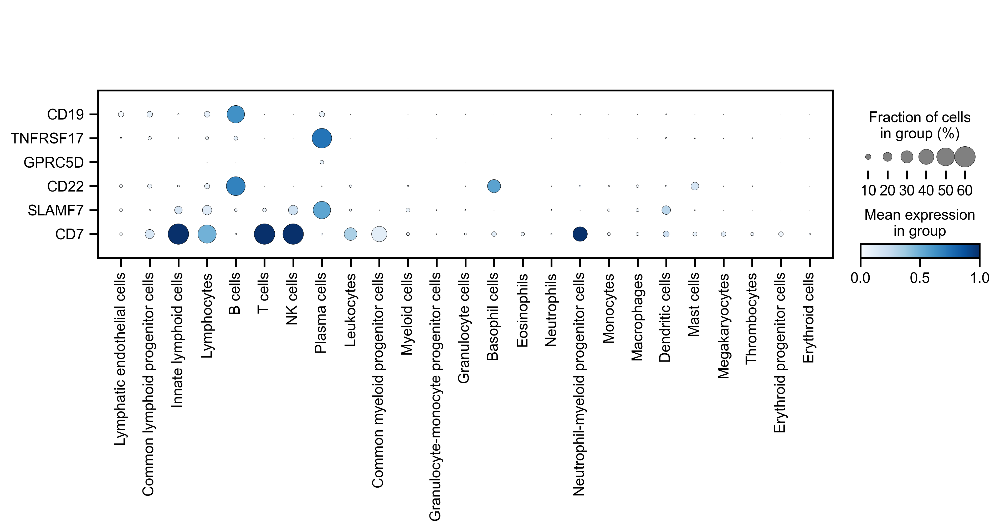

In [12]:
sc.pl.dotplot(adata_immune, clinical_targets, ['celltype'], 
              dendrogram=False, 
              cmap='Blues',
              vmax=1, 
              vmin=0, 
              swap_axes=True, 
              dot_min=0, 
              dot_max=0.6,
              use_raw=False)

### Per organ

In [13]:
celltypes=list(adata.obs['celltype'].cat.categories)
celltypes.remove("Unknown")

In [14]:
ix=np.isin(adata.obs['celltype'],celltypes) 
adata=adata[ix].copy()

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [16]:
immune_cells=np.array(immune_cells)
celltypes=np.array(celltypes)

In [17]:
remaining_cells=celltypes[np.isin(celltypes, immune_cells, invert=True)]
remaining_cells=np.array(remaining_cells)

In [19]:
celltypes_order=np.concatenate((immune_cells, remaining_cells), axis=None)

In [21]:
adata.obs['celltype'].cat.reorder_categories(celltypes_order, inplace=True)

/var/folders/fj/5ywcjg851092_gqm88cq4t3dt4qvjk/T/ipykernel_80790/896731199.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['celltype'].cat.reorder_categories(celltypes_order, inplace=True)


In [23]:
len(adata.obs['Organ'].cat.categories)

35

In [24]:
adata.obs['Organ'].cat.categories

Index(['AdiposeTissue', 'AdrenalGland', 'Bladder', 'Blood', 'BoneMarrow',
       'Brain', 'Breast', 'Eye', 'FallopianTube', 'GallBladder', 'Gut_Colon',
       'Gut_SmallIntestine', 'Heart', 'Kidney', 'Liver', 'Lung', 'LymphNode',
       'Muscle', 'Oesophagus', 'Omentum', 'Pancreas', 'Placenta', 'Pleura',
       'Prostate', 'SalivaryGland', 'Skin', 'Spleen', 'Stomach', 'Thymus',
       'ThyroidGland', 'Tongue', 'Trachea', 'Ureter', 'Uterus', 'Vasculature'],
      dtype='object')

In [25]:
organs_plot=['BoneMarrow','Blood', 'Brain','Lung','LymphNode','Spleen','Heart','Liver','Kidney']

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


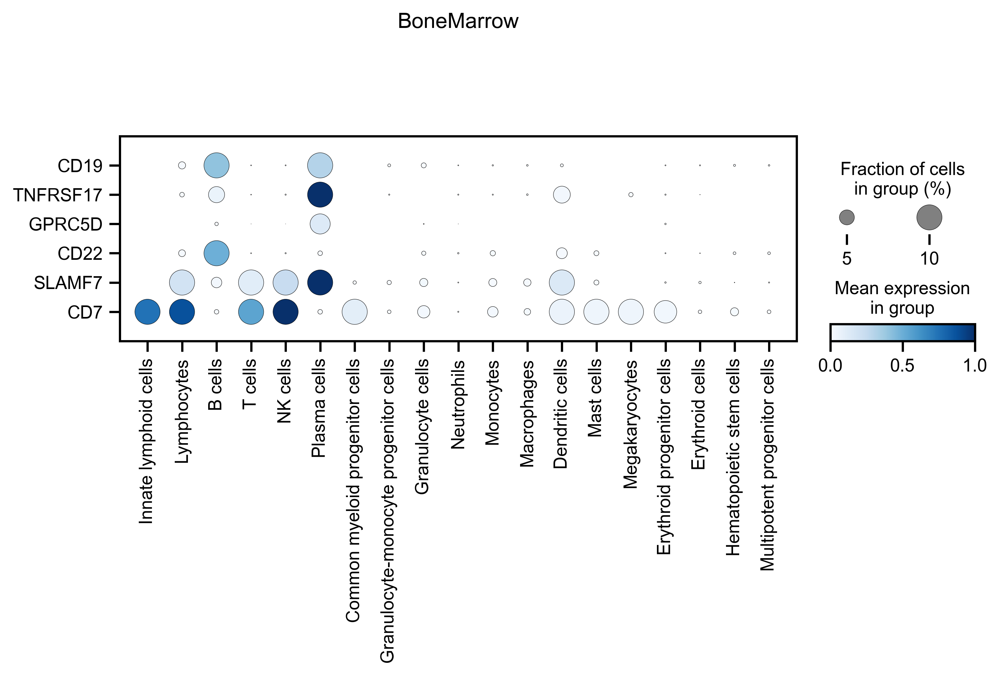

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


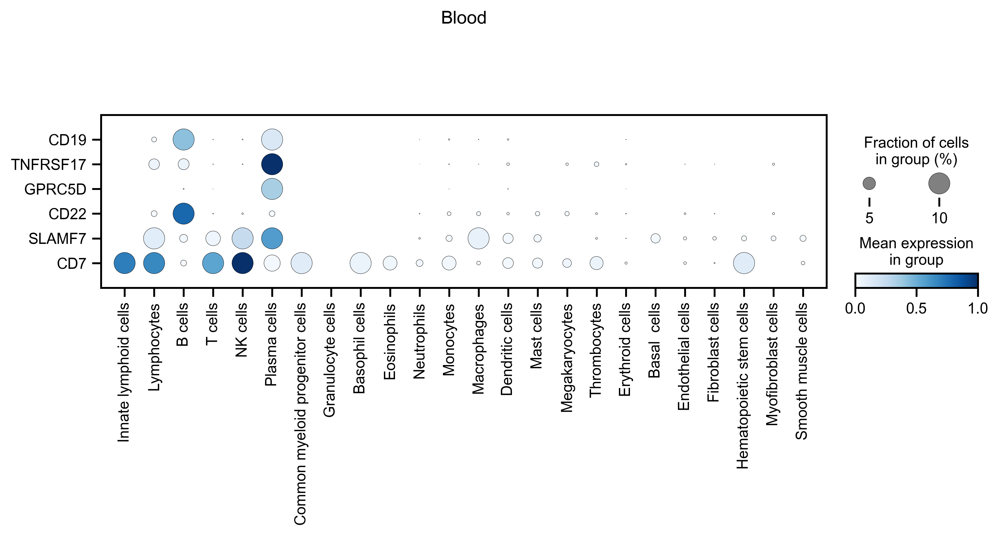

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


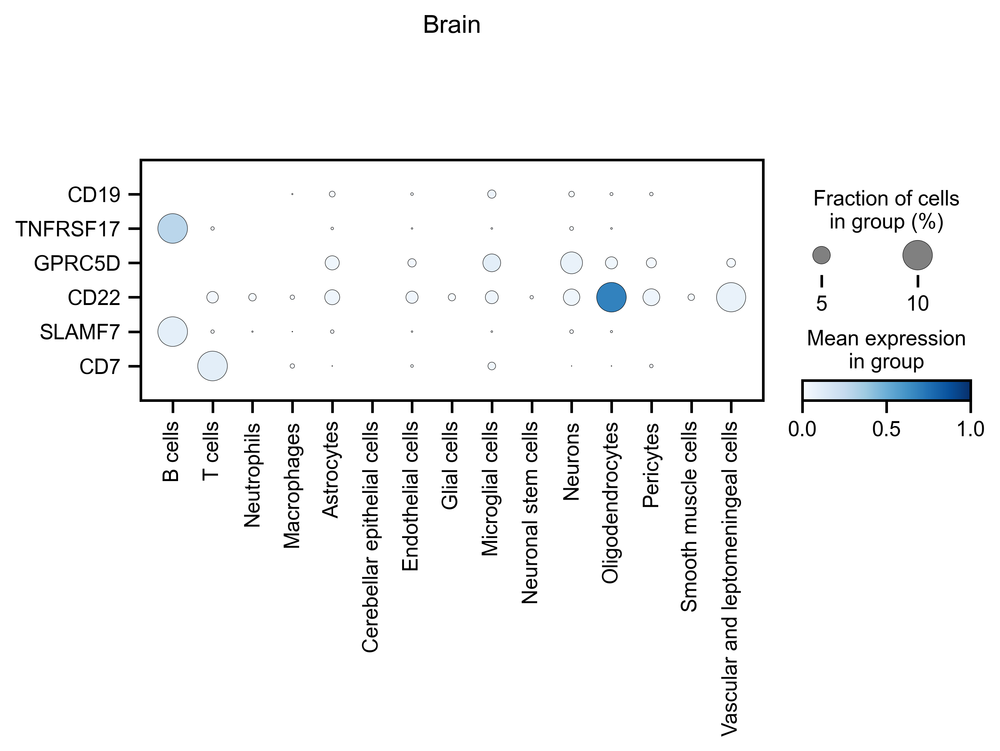

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


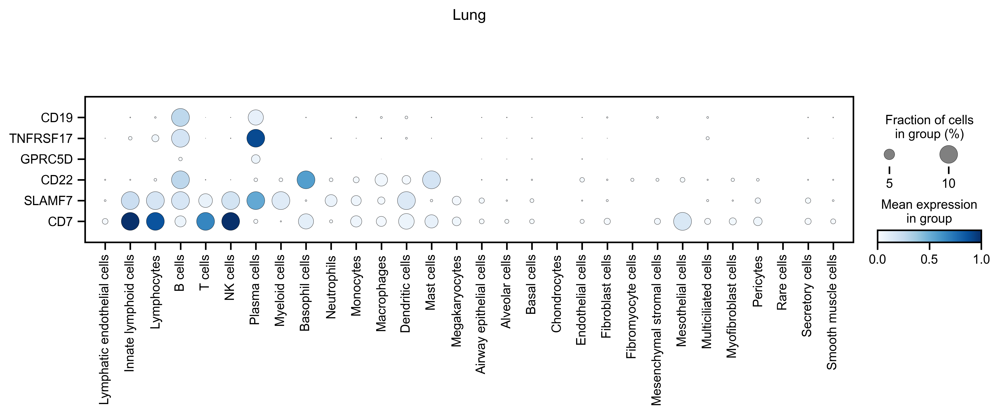

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


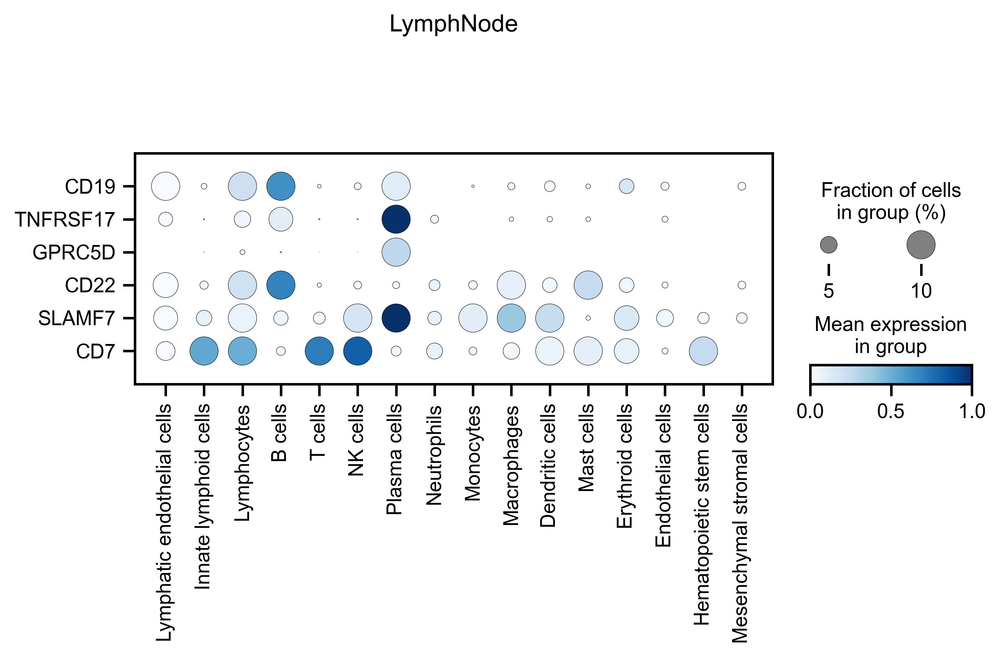

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


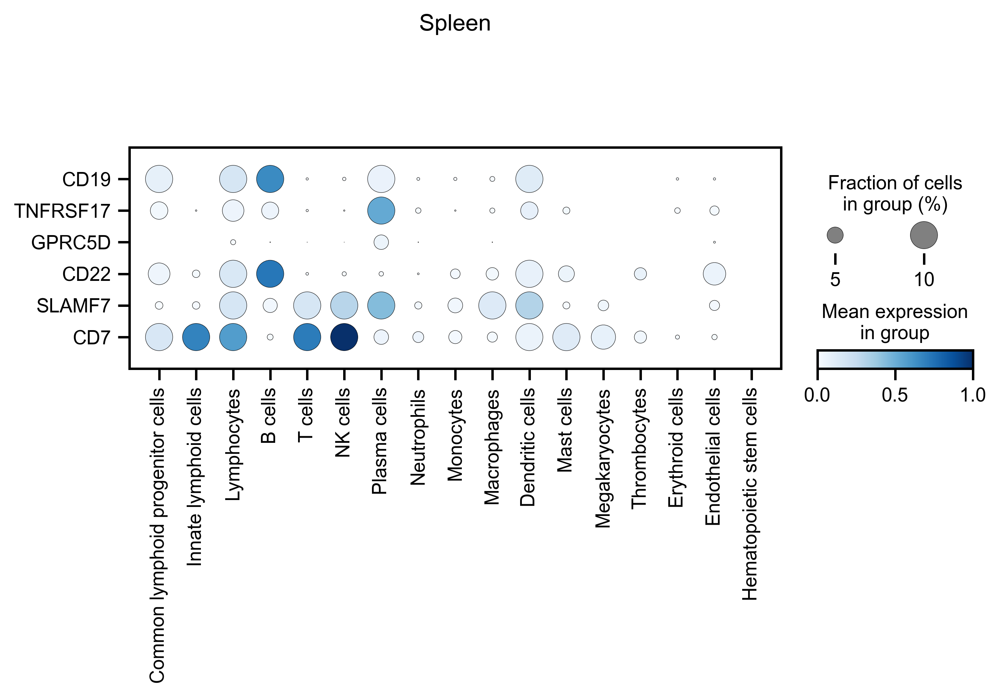

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


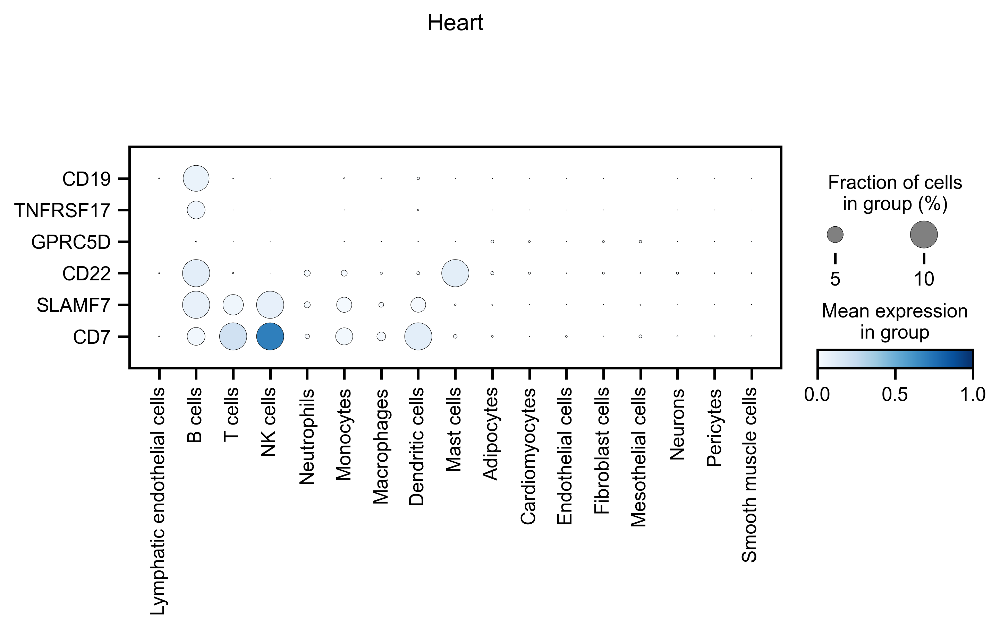

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


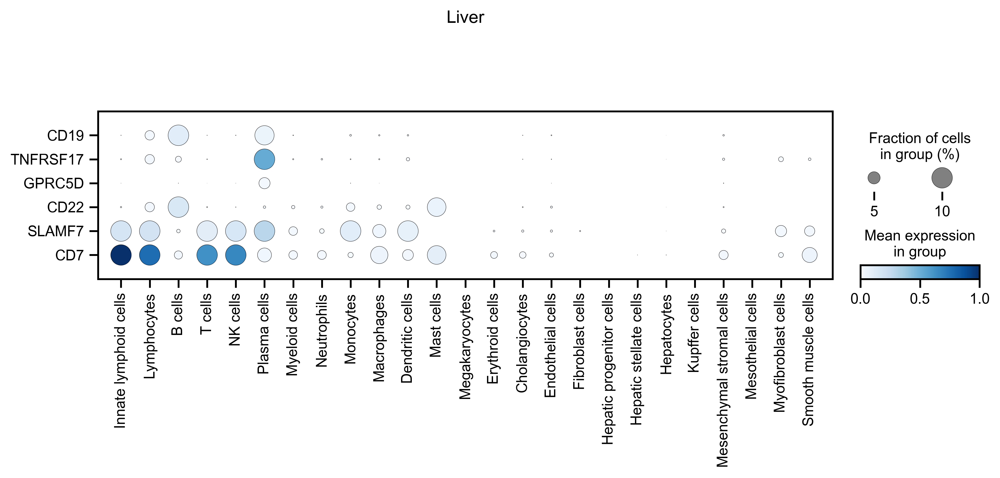

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


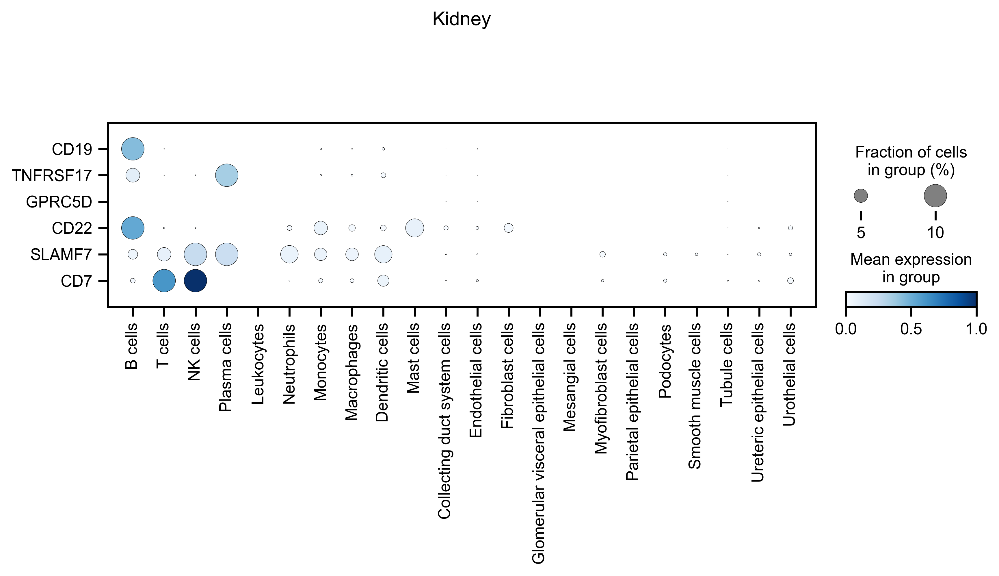

In [26]:
for organ in organs_plot:
    
    # only organ
    ix=np.isin(adata.obs['Organ'], [organ]) 
    adata_sub=adata[ix].copy()
    
    sc.pl.dotplot(adata_sub, clinical_targets, ['celltype'], 
                  title=organ,
              dendrogram=False, 
                  cmap='Blues',
              vmax=1, 
              vmin=0, 
              swap_axes=True, 
              dot_min=0, 
              dot_max=0.1,
              use_raw=False)

## Investigational targets

In [9]:
non_clinical_targets=['MS4A1','SDC1','NCAM1','CD38','IL3RA','KLRK1','CD44','ROR1','TNFRSF13C','TNFRSF9',
                      'TNFRSF8',
                      'CD79A']

### Pooled blood and immune cells

In [10]:
# immune cells
immune_cells=['Lymphatic endothelial cells','Common lymphoid progenitor cells','Innate lymphoid cells',
              'Lymphocytes','B cells','T cells', 'NK cells','Plasma cells','Leukocytes',
              'Common myeloid progenitor cells', 'Myeloid cells',
              'Granulocyte-monocyte progenitor cells','Granulocyte cells','Basophil cells','Eosinophils',
              'Neutrophils','Neutrophil-myeloid progenitor cells',
              'Monocytes','Macrophages', 'Dendritic cells','Mast cells', 'Megakaryocytes','Thrombocytes',
              'Erythroid progenitor cells', 'Erythroid cells']

In [11]:
# only immune cells
ix=np.isin(adata.obs['celltype'], immune_cells) 
adata_immune=adata[ix].copy()
adata_immune.obs['celltype']=adata_immune.obs['celltype'].cat.reorder_categories(list(immune_cells), ordered=True)

In [ ]:
sc.pl.dotplot(adata_immune, non_clinical_targets, ['celltype'], 
              dendrogram=False, 
              cmap='Blues',
              vmax=1, 
              vmin=0, 
              swap_axes=True, 
              dot_min=0, 
              dot_max=0.6,
              save='atlas_immune.png',
              use_raw=False)

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


### Per organ

In [18]:
celltypes=list(adata.obs['celltype'].cat.categories)
celltypes.remove("Unknown")

In [19]:
ix=np.isin(adata.obs['celltype'],celltypes) 
adata=adata[ix].copy()

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [20]:
len(immune_cells)

25

In [21]:
immune_cells=np.array(immune_cells)
celltypes=np.array(celltypes)

In [22]:
remaining_cells=celltypes[np.isin(celltypes, immune_cells, invert=True)]
remaining_cells=np.array(remaining_cells)

In [24]:
celltypes_order=np.concatenate((immune_cells, remaining_cells), axis=None)

In [26]:
adata.obs['celltype'].cat.reorder_categories(celltypes_order, inplace=True)

/var/folders/fj/5ywcjg851092_gqm88cq4t3dt4qvjk/T/ipykernel_62607/896731199.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['celltype'].cat.reorder_categories(celltypes_order, inplace=True)


In [27]:
organs_plot=['BoneMarrow','Blood', 'Brain','Lung','LymphNode','Spleen','Heart','Liver','Kidney']

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


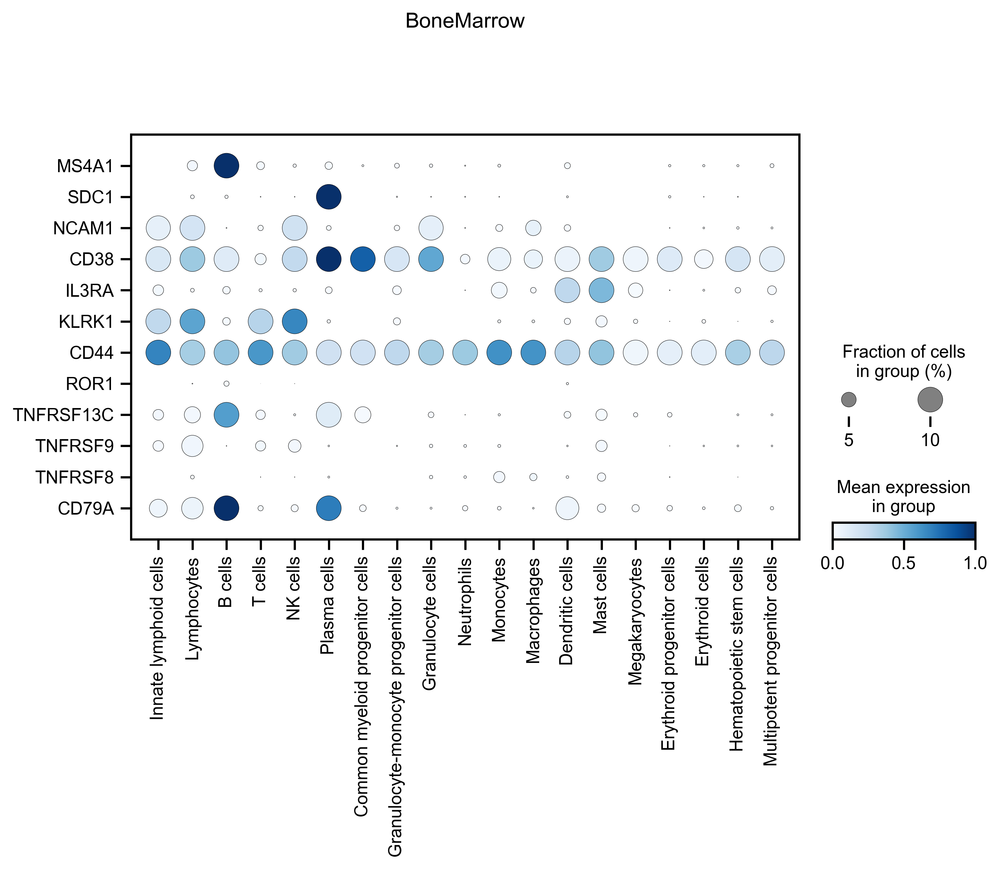

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


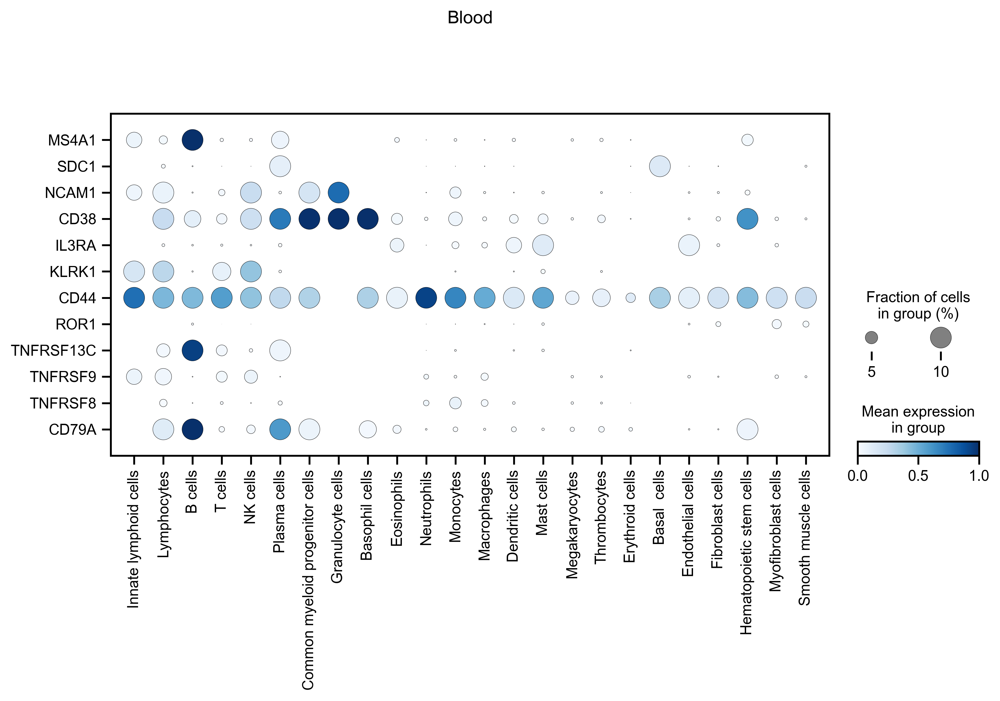

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


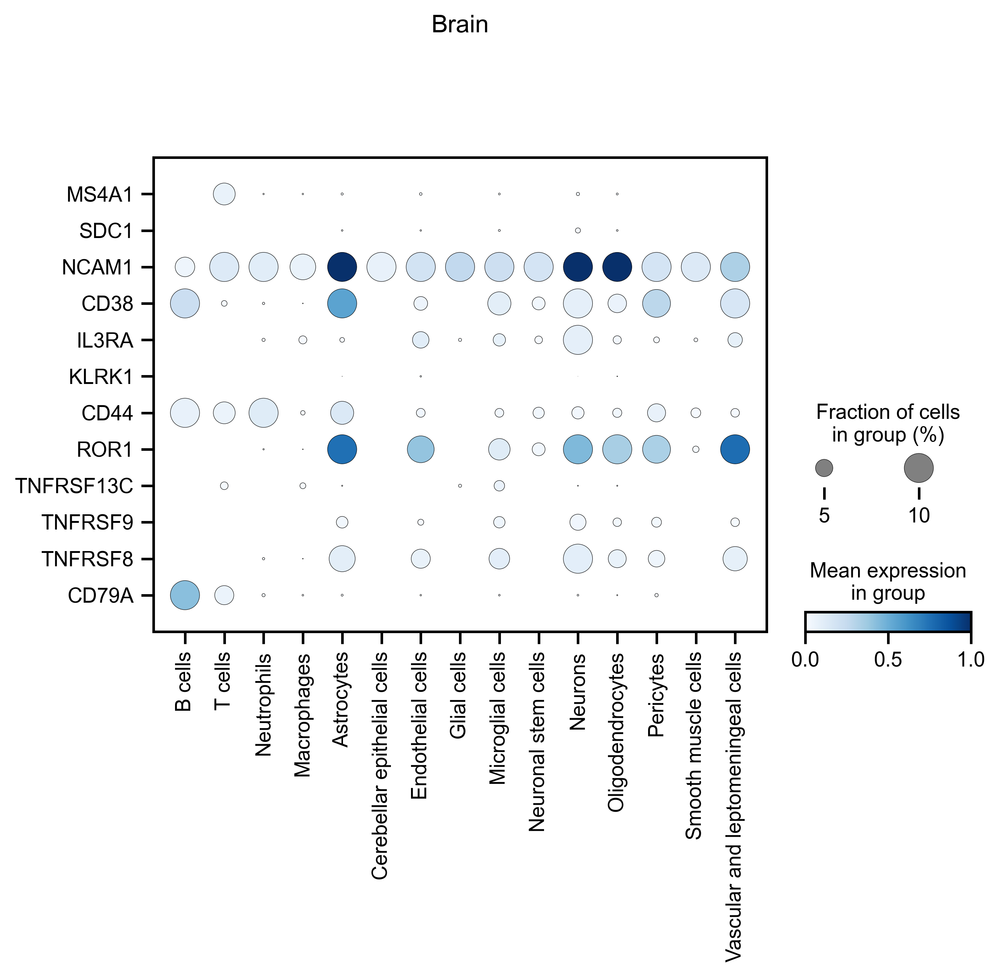

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


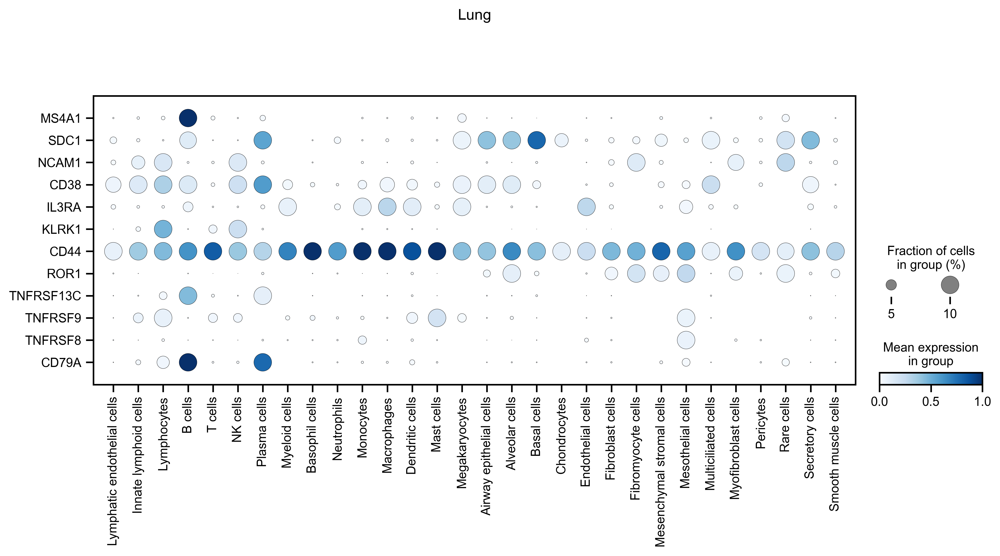

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


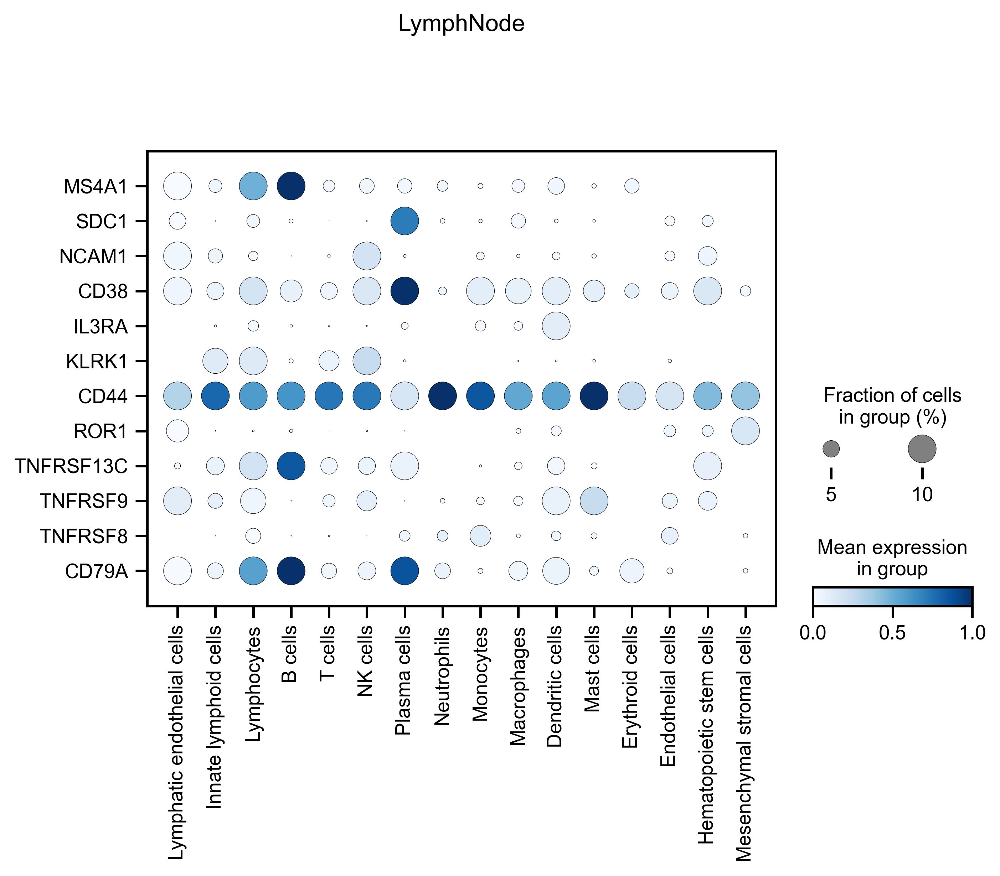

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


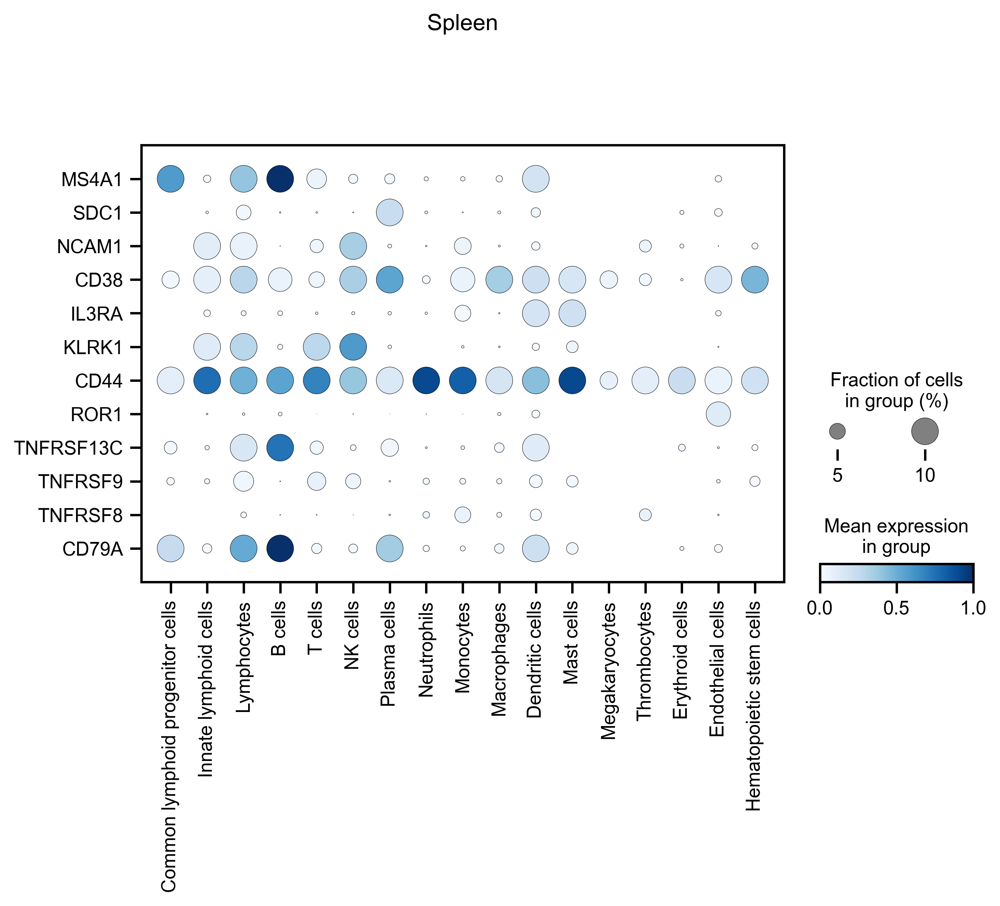

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


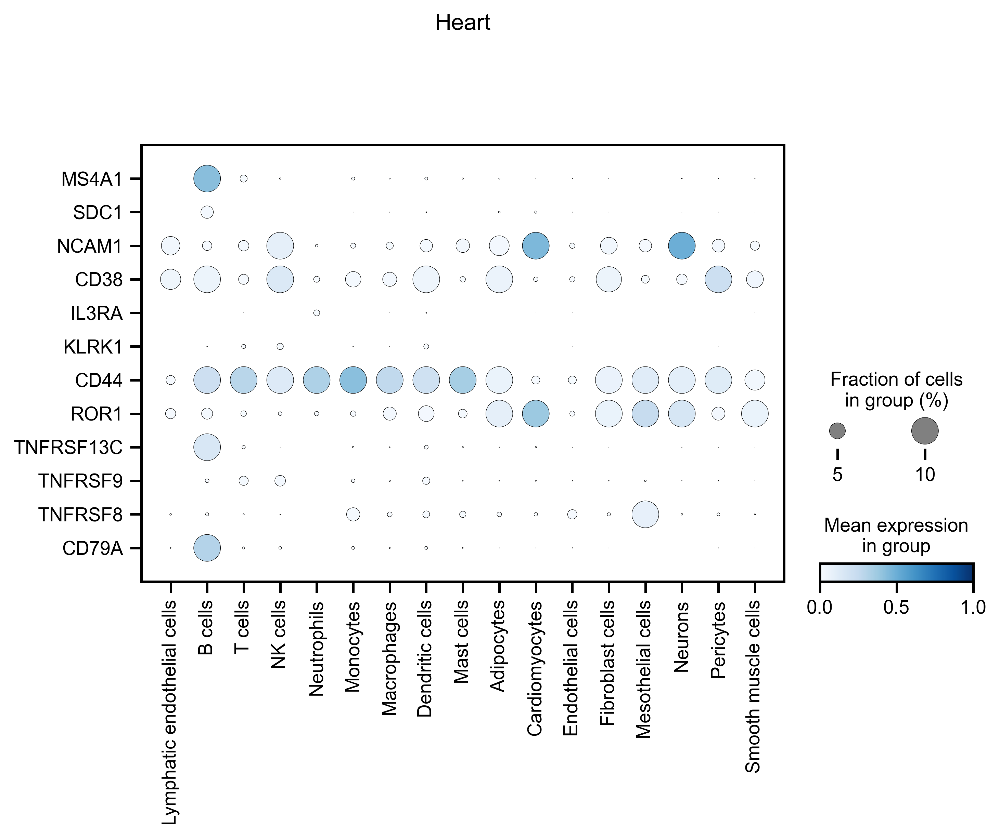

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


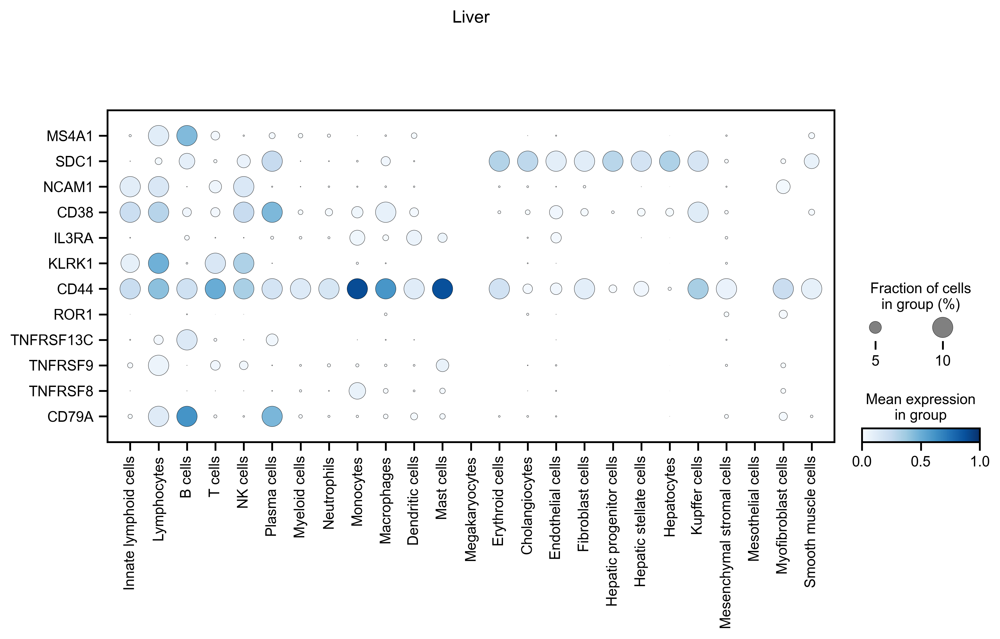

/Users/moritz.thomas/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


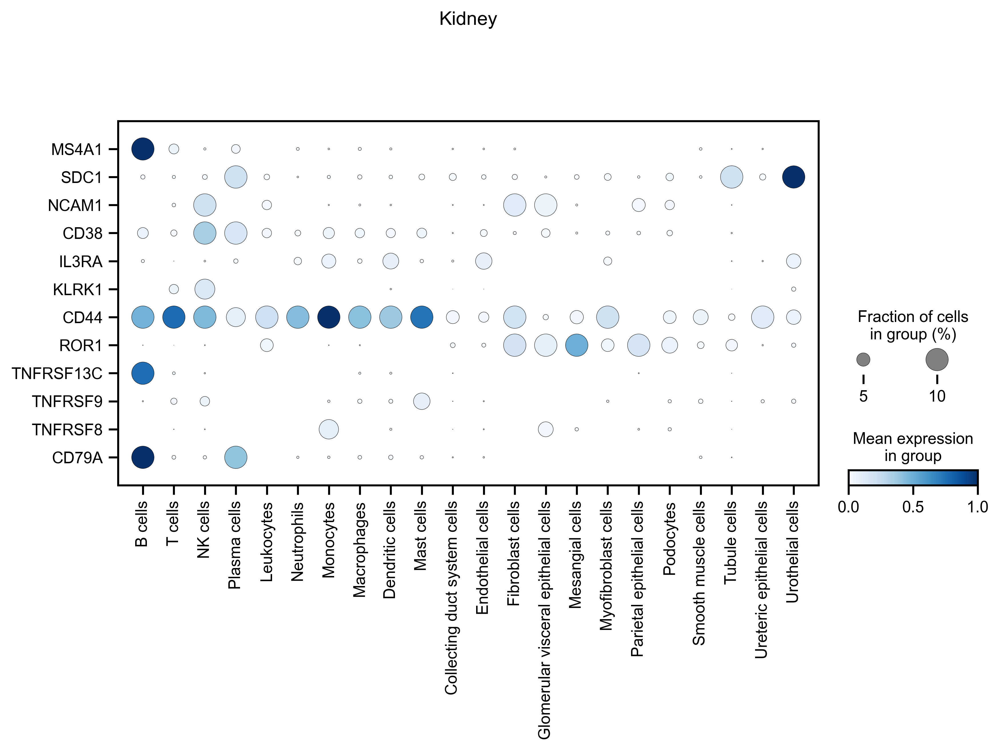

In [28]:
for organ in organs_plot:
    
    # only organ
    ix=np.isin(adata.obs['Organ'], [organ]) 
    adata_sub=adata[ix].copy()
    
    sc.pl.dotplot(adata_sub, non_clinical_targets, ['celltype'], 
                  title=organ,
                  cmap='Blues',
              dendrogram=False, 
                  save=str(organ)+'_atlas.png',
              vmax=1, 
              vmin=0, 
              swap_axes=True, 
              dot_min=0, 
              dot_max=0.1,
              use_raw=False)